In [335]:
import pandas as pd
import glob
from pandas import read_excel
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')
import plotly.graph_objects as go
import seaborn as sns

In [336]:
# File paths

path_sfoc = r'C:\Users\dps\Documents\FLEET PERFORMANCE\2.Sfoc_calibration/Phoebe2.csv'
path_power = r'C:\Users\dps\Documents\FLEET PERFORMANCE\2.Sfoc_calibration\Phoebe1.csv'

# Load the datasets
df_sfoc = pd.read_csv(path_sfoc, delimiter=';', decimal=',', parse_dates = ['date'])
df_power = pd.read_csv(path_power, delimiter=';', decimal=',', parse_dates = ['date'])

# Set datatypes for both datasets
df_power['date'] =  pd.to_datetime(df_power['date'])
df_power['date'] = df_power['date'].dt.strftime('%d-%m-%Y')
df_power['date'] = pd.to_datetime(df_power['date'], errors='coerce')
df_power['visible_power'] = df_power['visible_power'].astype(str)
df_power['corrected_power'] = df_power['corrected_power'].astype(float)


df_sfoc['date'] =  pd.to_datetime(df_sfoc['date'])
df_sfoc['date'] = df_sfoc['date'].dt.strftime('%d-%m-%Y')
df_sfoc['date'] = pd.to_datetime(df_sfoc['date'], errors='coerce')
df_sfoc['visible_sfoc'] = df_sfoc['visible_sfoc'].astype(str)
df_sfoc['sfoc_percent'] = df_sfoc['sfoc_percent'].astype(float)


In [337]:
# Test that datasets are loaded properly (to do so we call the first 2 lines of the dataset)

display(df_sfoc.head(2))
display(df_power.head(2))

,visible_sfoc,date,sfoc_percent
0,TRUE,2021-06-20,99.356233
1,TRUE,2021-06-20,99.338224


,visible_power,date,corrected_power
0,TRUE,2021-06-20,84.157792
1,Wave Height,2021-06-20,158.487753


In [338]:
# Check the time range of the datasets

print('fisrt day of sfoc dataset',  df_sfoc.date.min())
print('last day of sfoc dataset',df_sfoc.date.max())
print('\n')
print('fisrt day of power dataset',df_power.date.min())
print('last day of power dataset',df_power.date.max())

fisrt day of sfoc dataset 2021-06-20 00:00:00
last day of sfoc dataset 2022-06-23 00:00:00


fisrt day of power dataset 2021-06-20 00:00:00
last day of power dataset 2022-06-18 00:00:00


In [339]:
# Check data types

display(df_sfoc.dtypes)
display(df_power.dtypes)

visible_sfoc            object
date            datetime64[ns]
sfoc_percent           float64
dtype: object

visible_power              object
date               datetime64[ns]
corrected_power           float64
dtype: object

In [340]:
# Merge the datasets

merged = pd.merge(df_power, df_sfoc, on="date")

In [341]:
merged.head(2)

,visible_power,date,corrected_power,visible_sfoc,sfoc_percent
0,TRUE,2021-06-20,84.157792,TRUE,99.356233
1,TRUE,2021-06-20,84.157792,TRUE,99.338224


In [342]:
# Keep only 'TRUE' values

merged_True = merged.loc[(merged['visible_power'] == 'TRUE') & (merged['visible_sfoc'] == 'TRUE') ]

In [343]:
merged_True.head(2)

,visible_power,date,corrected_power,visible_sfoc,sfoc_percent
0,TRUE,2021-06-20,84.157792,TRUE,99.356233
1,TRUE,2021-06-20,84.157792,TRUE,99.338224


In [344]:
# Correlation for all variables of the dataset

merged_True.corr()

,corrected_power,sfoc_percent
corrected_power,1.000000,-0.257161
sfoc_percent,-0.257161,1.000000


In [345]:
print('fisrt day of MERGED dataset', merged_True.date.min())
print('last day of MERGED dataset', merged_True.date.max())

fisrt day of MERGED dataset 2021-06-20 00:00:00
last day of MERGED dataset 2022-06-18 00:00:00


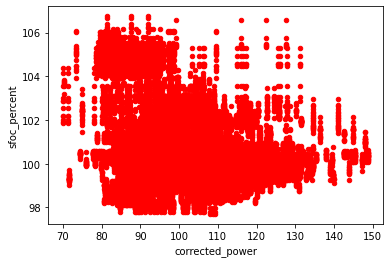

In [346]:
# Simple plot

merged_True.plot(kind='scatter',x='corrected_power',y='sfoc_percent',color='red')
plt.show()


In [347]:
# POWER - SFOC plot

df = merged_True

fig = go.Figure(go.Scatter(
    x = df['corrected_power'],
    y = df['sfoc_percent'],
    mode="markers"
))

fig.update_layout(title="POWER - SFOC       Period: 6/2021- 6/2022")

fig.show()

In [348]:
# Comments on the above chart

# we assume negative correlation when SFOC values are high.
# For example, when SFOC is around 104 - 106, POWER is around 75 - 100

# For some other areas we observe zero correlation

<AxesSubplot:>

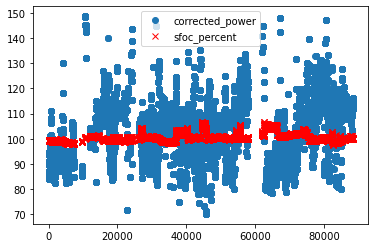

In [349]:
# Simple plot

df = merged_True[['corrected_power', 'sfoc_percent']]

df.plot(style=['o','rx'])

In [350]:
# Advanced plot

import plotly.express as px 
import pandas as pd 
import numpy as np 

# Get some data
df = merged_True

# Plot 
fig = px.scatter(df, x='date', y='sfoc_percent')

# Only thing I figured is - I could do this 
fig.add_scatter(x=df['date'], y=df['corrected_power'], mode='markers', name = 'Corrected Power')
fig.update_layout(title="POWER - SFOC       Period: 6/2021- 6/2022", hovermode="x")

# Show plot 
fig.show()

# Split Dataset to intervals

# Correlation Table

In [351]:
# groupby your key and freq

g = merged_True.groupby(pd.Grouper(key='date', freq='M'))

In [352]:

# extract month value and assign into variable for later use

start_date = merged_True.date.min()
end_date = merged_True.date.max()
pd.date_range(start_date, end_date, freq="M")

month = pd.period_range(start_date, end_date, freq="M")

In [353]:
# groups to a list of dataframes with list comprehension

dfs = [group for _,group in g]

In [354]:
# Split the Dataset to each month

# for i in range (0, len(dfs)):
#     print('Month:', i, dfs[i].corr())

In [355]:
# Set empty dataframe

column_names = ['month_interval', 'correlation']

df_correlation = pd.DataFrame(columns = column_names)

In [356]:
# function to create lists

def correlations_table():    
    corr_list = []
    month_list = []
    column_names = ['month_interval', 'correlation']
    df_correlation = pd.DataFrame(columns = column_names)
    
    for k in range(0, len(dfs)):
        corr_list.append(dfs[k].corr().iloc[0,1].round(2))
    for m in range(0, len(dfs)):
        month_list.append(month[m]) 
        
correlations_table()

In [357]:
# Display correlation table

df_correlation['correlation'] = corr_list
df_correlation['month_interval'] = month_list

df_correlation['month_interval'] = df_correlation['month_interval'].astype(str)
df_correlation['month_interval'] = pd.to_datetime(df_correlation['month_interval'])

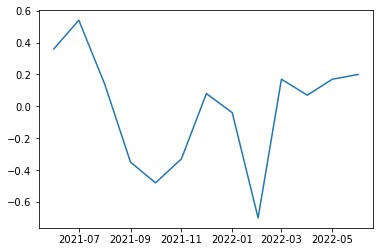

In [361]:
# Plot the correlation of each month/period

plt.plot(df_correlation["month_interval"], df_correlation["correlation"])

In [359]:
# POWER - SFOC plot

df = df_correlation
fig = px.line(df, x='month_interval', y="correlation")
fig.show()